In [2]:
import numpy as np
#from mayavi import mlab
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

In [3]:
# Our 2-dimensional distribution will be over variables X and Y
N = 120
X = np.linspace(-3, 10, N)
Y = np.linspace(-3, 10, N)
X, Y = np.meshgrid(X, Y)

# First Distro

In [4]:
# Mean vector and covariance matrix
mu_1 = np.array([1, 1])
Sigma_1 = np.array([[1. , 0], [0,  1]])

# Second Distro

In [5]:
# Mean vector and covariance matrix
mu_2 = np.array([6, 6])
Sigma_2 = np.array([[1 , 0], [0,  1]])

In [6]:
# Pack X and Y into a single 3-dimensional array
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X
pos[:, :, 1] = Y

In [7]:
from scipy.stats import multivariate_normal

def multivariate_gaussian(pos, mu, Sigma):
    """Return the multivariate Gaussian distribution on array pos.

    pos is an array constructed by packing the meshed arrays of variables
    x_1, x_2, x_3, ..., x_k into its _last_ dimension.

    """
    n = mu.shape[0]
    Sigma_det = np.linalg.det(Sigma)
    Sigma_inv = np.linalg.inv(Sigma)
    N = np.sqrt((2*np.pi)**n * Sigma_det)
    # This einsum call calculates (x-mu)T.Sigma-1.(x-mu) in a vectorized
    # way across all the input variables.
    fac = np.einsum('...k,kl,...l->...', pos-mu, Sigma_inv, pos-mu)

    return np.exp(-fac / 2) / N

In [8]:
# The distribution on the variables X, Y packed into pos.
Z_1 = multivariate_gaussian(pos, mu_1, Sigma_1)
Z_2 = multivariate_gaussian(pos, mu_2, Sigma_2)

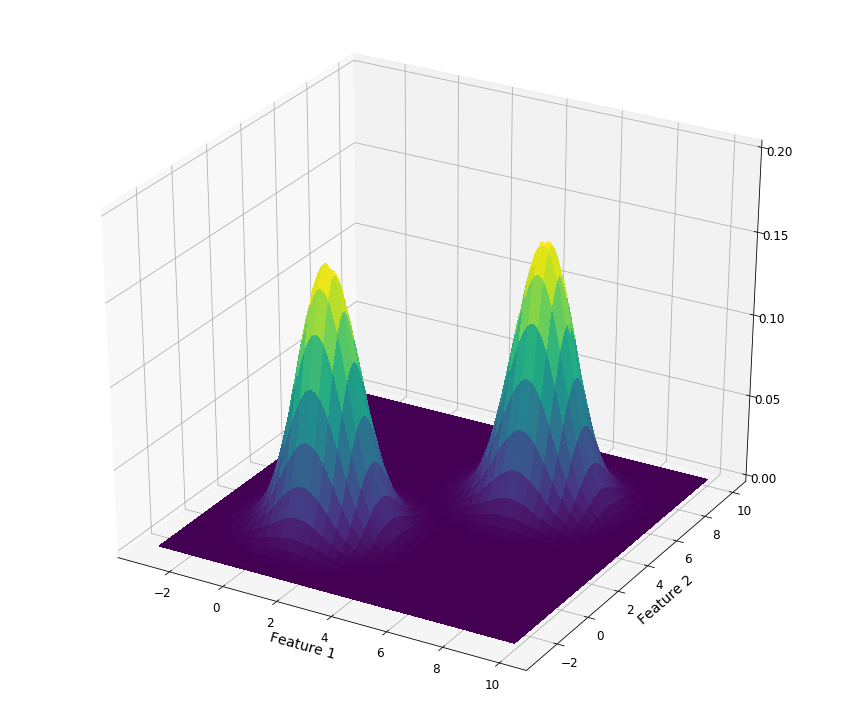

In [9]:
plt.rcParams["figure.figsize"] = 15,13
# Create a surface plot and projected filled contour plot under it.
fig = plt.figure()
ax = fig.gca(projection='3d')

# Adjust the limits, ticks and view angle
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)

ax.set_zlim(0,0.2)
ax.set_zticks(np.linspace(0,0.2,5))

#Plot
Z = Z_1 + Z_2; # To plot two graphs together
ax.plot_surface(X, Y, Z, rstride=3, cstride=3, linewidth=1, antialiased=False,cmap=cm.viridis);
plt.savefig('Dist1.png')

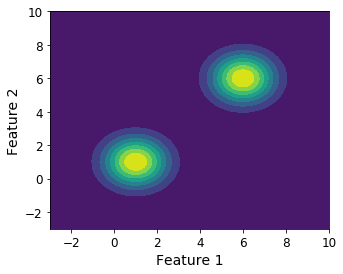

In [10]:
plt.rcParams["figure.figsize"] = 5,4
fig = plt.figure()
ax = fig.gca()
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)
cf = ax.contourf(X, Y, Z)
plt.savefig('Countour1.png')

C:\Users\lauro\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


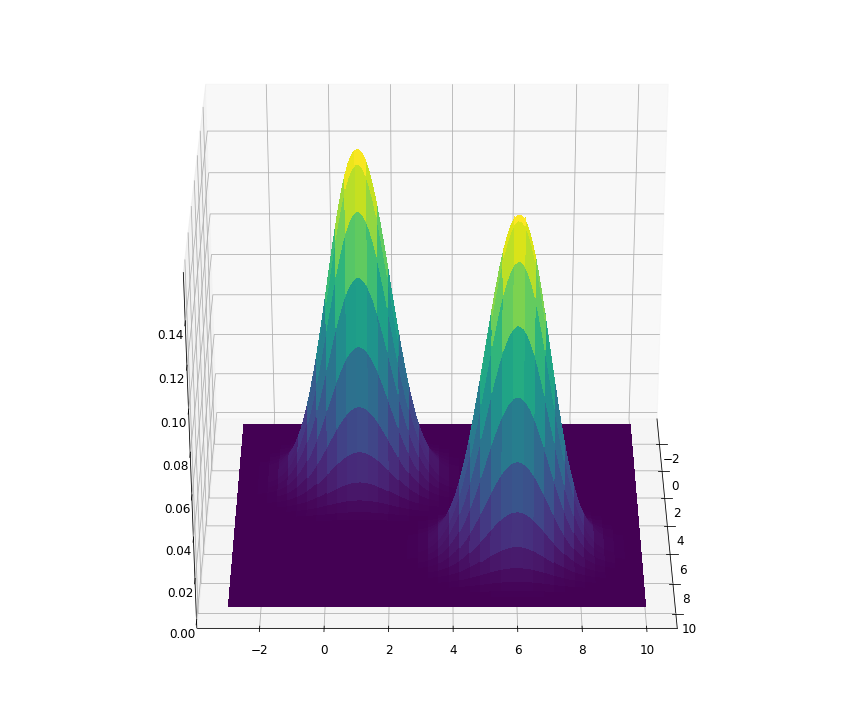

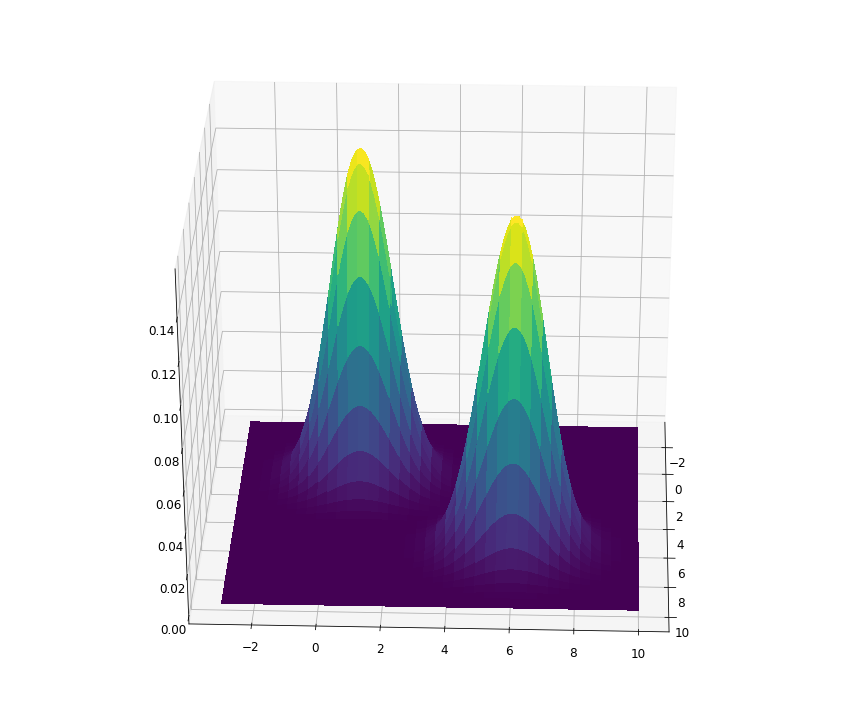

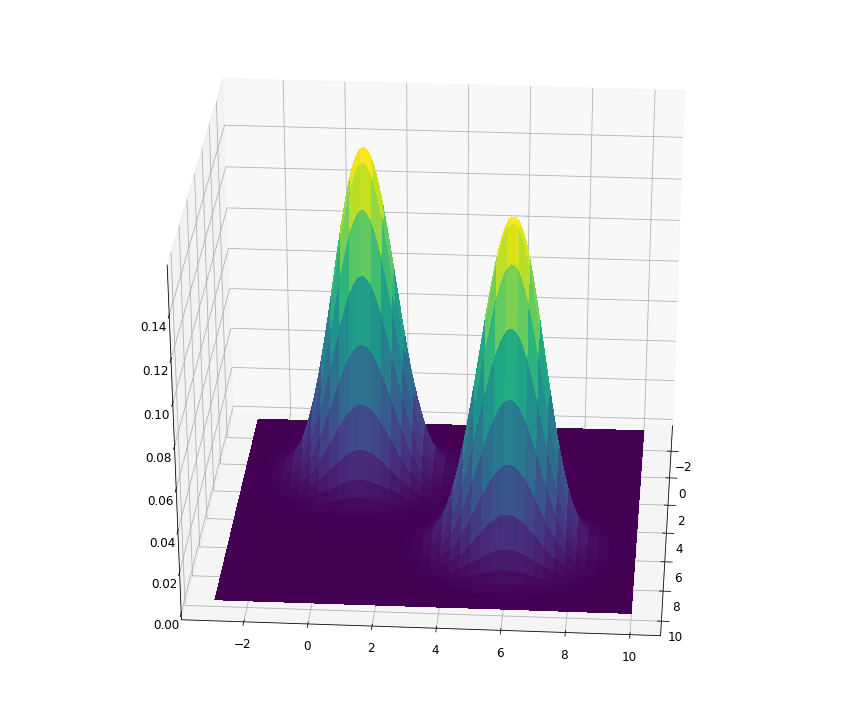

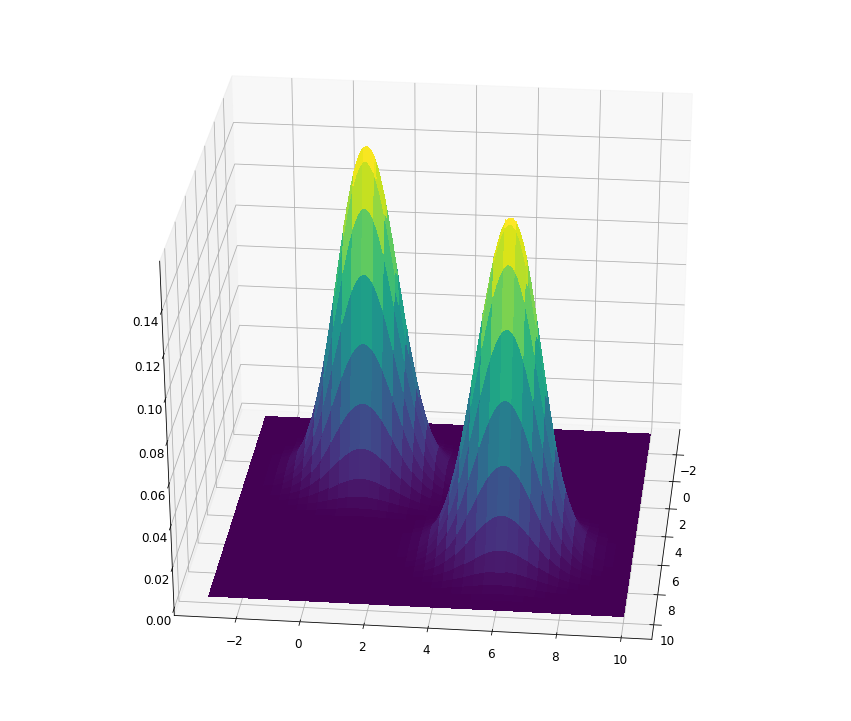

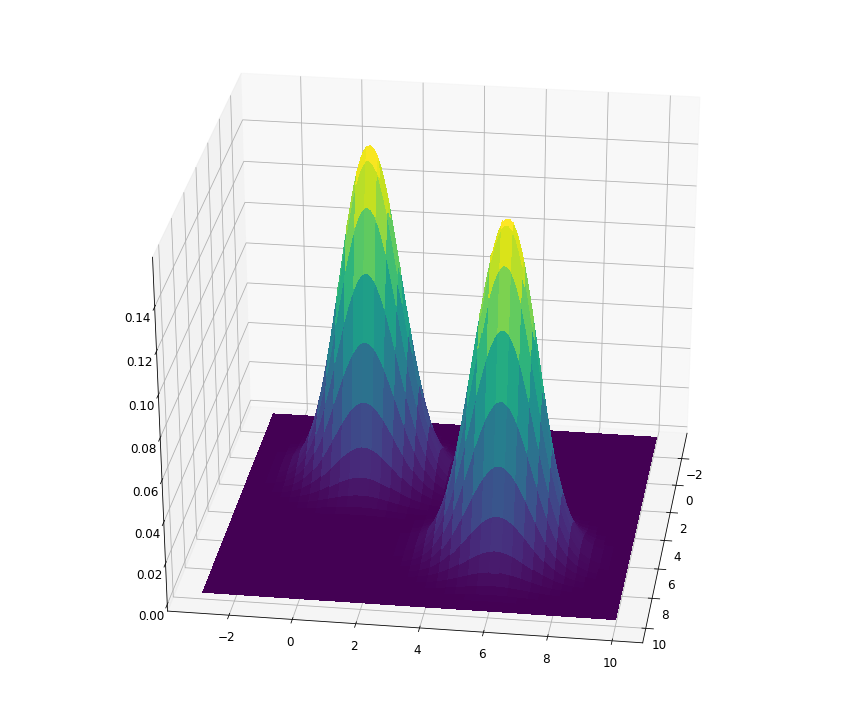

...

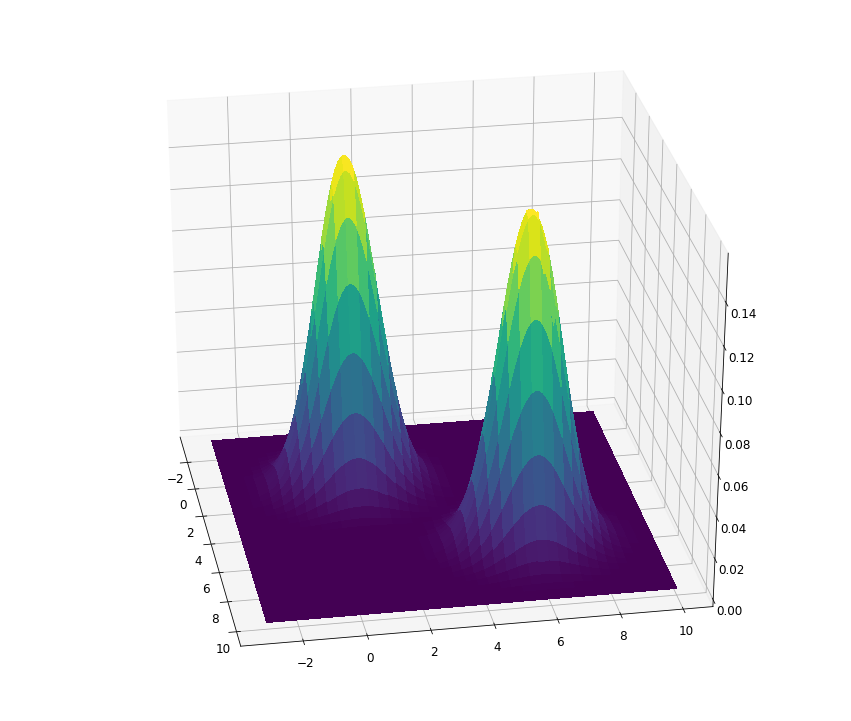

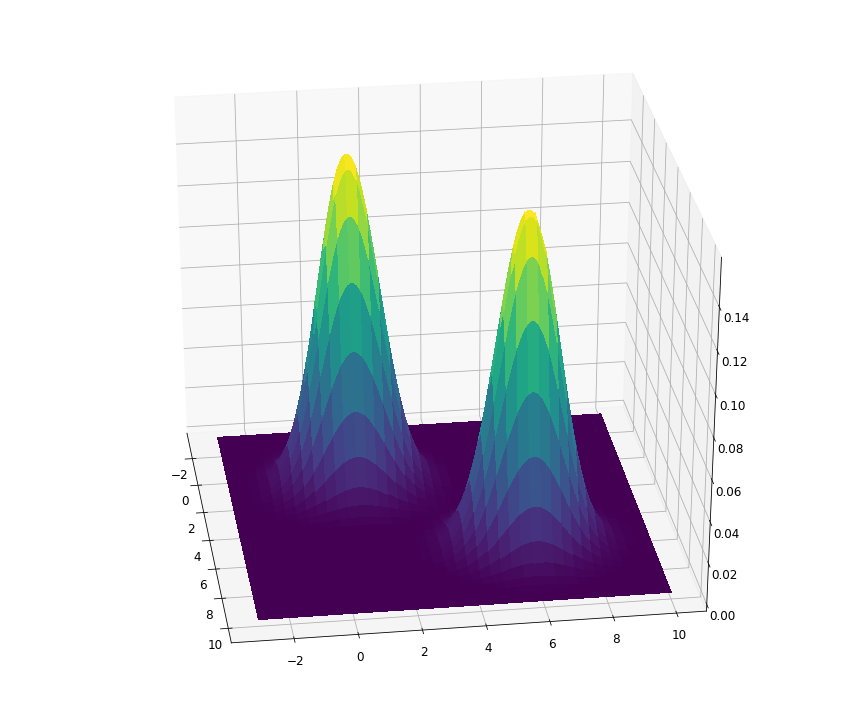

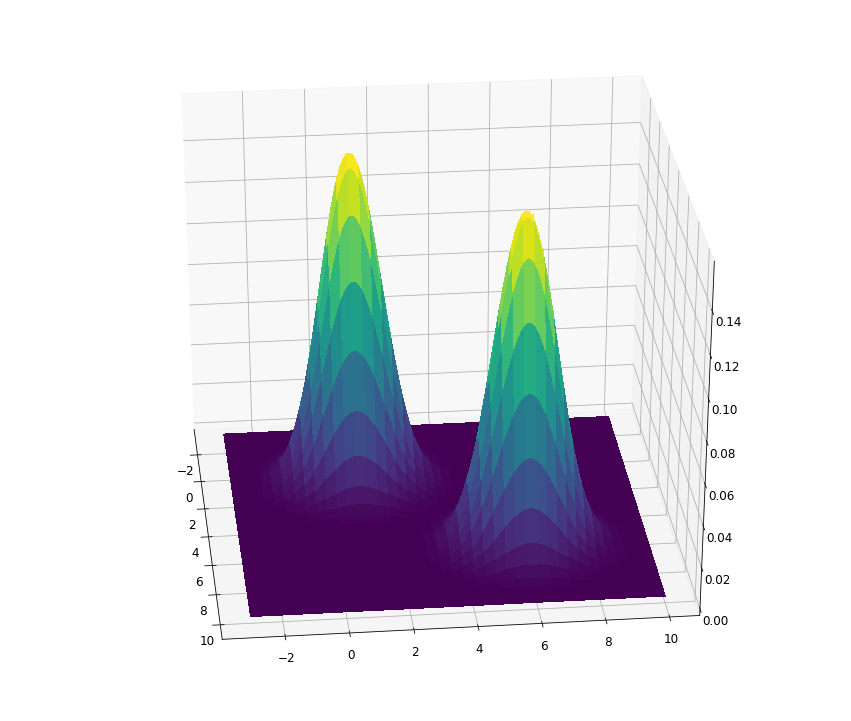

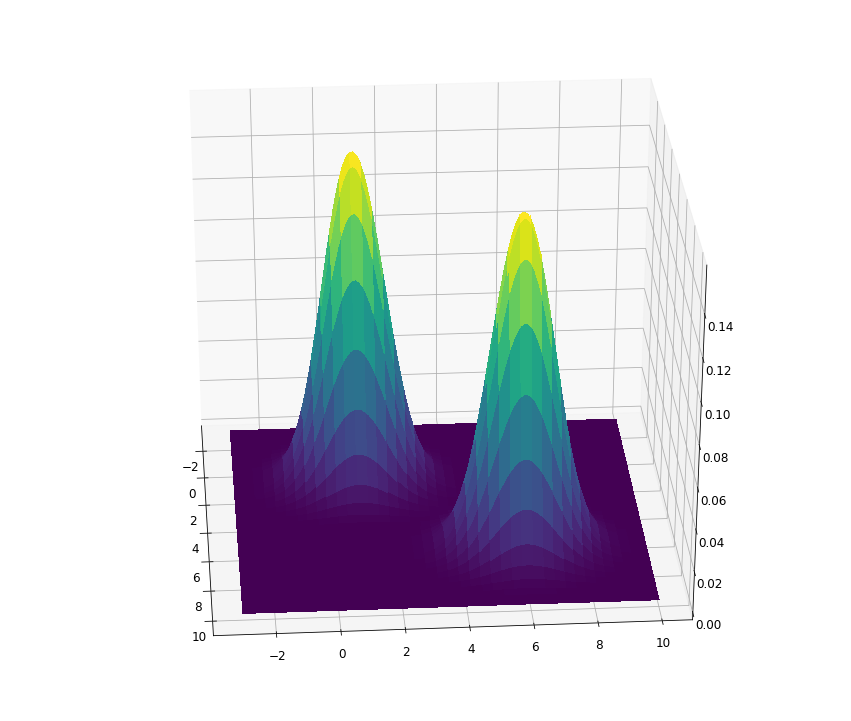

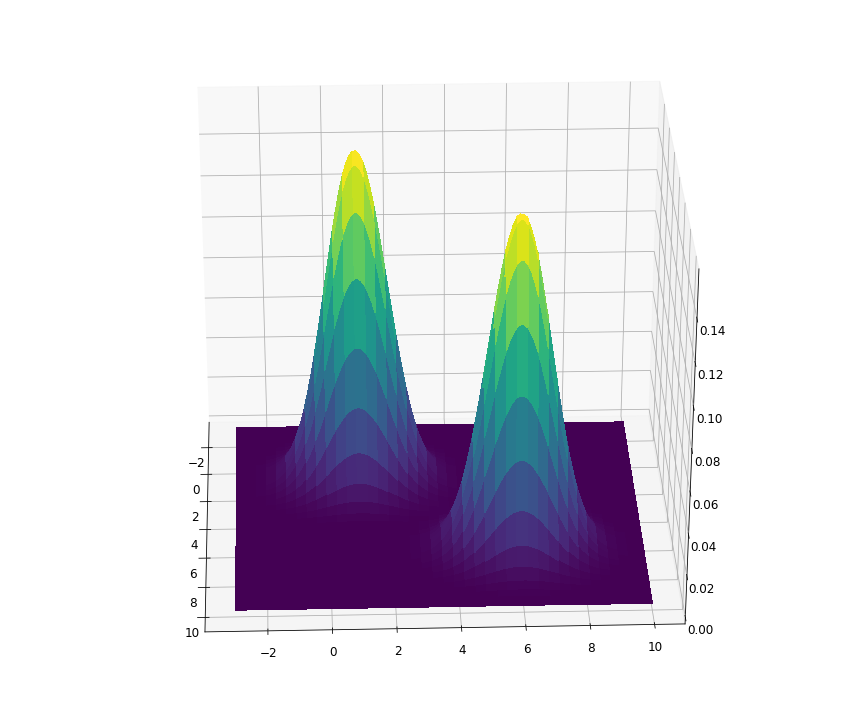

In [16]:
# We are going to do 20 plots, for 20 different angles
plt.rcParams["figure.figsize"] = 15,13

for angle in range(0,360,2):
    # Make the plot
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot_surface(X, Y, Z, rstride=3, cstride=3, linewidth=1, antialiased=False,cmap=cm.viridis);
    ax.view_init(30,angle)
    filename='Distro'+str(angle)+'.png'
    plt.savefig(filename)#, dpi=96)
    plt.gca()

In [17]:
import os
import imageio

png_dir = '.'
images = []
for file_name in os.listdir(png_dir):
    if file_name.endswith('.png'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
imageio.mimsave('./movie.gif', images)